In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from statistics import median
from statistics import mode
from tslearn.clustering import TimeSeriesKMeans
from tslearn.barycenters import euclidean_barycenter, dtw_barycenter_averaging, softdtw_barycenter
import matplotlib.pyplot as plt

In [69]:

def get_eba_from_df(df,cols=0):
    ''''
    This assumes df has a column of the index which was auto set to 'Unnamed 0' as is the case
    when the user imports without explicitly specifying the date time column
    '''

    if cols==0:
        cols = df.columns.to_list()
    # if df.columns.tolist()[0] == 'Unnamed: 0':
    #     df.rename(columns={'Unnamed: 0':'modified_index'}, inplace=True)
    #     df.set_index('modified_index', inplace=True)
    data_tranposed = df.to_numpy().T
    data_eba = euclidean_barycenter(data_tranposed)
    data_eba_transposed = data_eba.transpose()
    data_with_eba = np.append(data_tranposed,data_eba_transposed, axis=0)
    data_cols_mod = df.columns.to_list()
    data_cols_mod.append('Euclidean Barycenter')
    data_eba_df = pd.DataFrame(data_with_eba.T,columns=data_cols_mod)
    data_eba_df.set_index(df.index,inplace=True)
    return data_eba_df

def get_medba_from_df(df,cols):
    ''''
    This assumes df has a column of the index which was auto set to 'Unnamed 0' as is the case
    when the user imports without explicitly specifying the date time column
    It calculates the cross-sectional median barycenter of the columns in the 'cols' list.
    '''
    if cols==0:
        cols = df.columns.to_list()
    # if df.columns.tolist()[0] == 'Unnamed: 0':
    #     df.rename(columns={'Unnamed: 0':'modified_index'}, inplace=True)
    #     df.set_index('modified_index', inplace=True)
    df['Median Barycenter'] = np.array(list(map(median,df[cols].to_numpy())))
    return df

def get_modba_from_df(df,cols):
    ''''
    This assumes df has a column of the index which was auto set to 'Unnamed 0' as is the case
    when the user imports without explicitly specifying the date time column
    It calculates the cross-sectional modal barycenter of the columns in the 'cols' list.
    '''
    if cols==0:
        cols = df.columns.to_list()
    # if df.columns.tolist()[0] == 'Unnamed: 0':
    #     df.rename(columns={'Unnamed: 0':'modified_index'}, inplace=True)
    #     df.set_index('modified_index', inplace=True)
    df['Modal Barycenter'] = np.array(list(map(mode,df[cols].to_numpy())))
    return df

def get_dba_from_df(df,cols):
    ''''
    This assumes df has a column of the index which was auto set to 'Unnamed 0' as is the case
    when the user imports without explicitly specifying the date time column
    It calculates the dynamic time warped barycenter of the columns in the 'cols' list.
    '''
    if cols==0:
        cols = df.columns.to_list()
    # if df.columns.tolist()[0] == 'Unnamed: 0':
    #     df.rename(columns={'Unnamed: 0':'modified_index'}, inplace=True)
    #     df.set_index('modified_index', inplace=True)
    df['DTW Barycenter'] = dtw_barycenter_averaging(df.values.transpose())  
    return df

def get_softdba_from_df(df,cols,gamma):
    ''''
    This assumes df has a column of the index which was auto set to 'Unnamed 0' as is the case
    when the user imports without explicitly specifying the date time column
    It calculates the dynamic time warped barycenter of the columns in the 'cols' list.
    '''
    if cols==0:
        cols = df.columns.to_list()
    # if cols[0] == 'Unnamed: 0':
    #     df.rename(columns={'Unnamed: 0':'modified_index'}, inplace=True)
    #     df.set_index('modified_index', inplace=True)
    name = 'SDTW Barycenter-G'+ str(gamma)
    df[name] = softdtw_barycenter(df.values.transpose(),gamma=gamma)  
    return df

def get_barycenters_from_df(df,cols=0):
    if cols==0:
        cols = df.columns.to_list()
    
    if cols[0] == 'Unnamed: 0':
        #print("[!]COL ID CAUGHT")
        df.rename(columns={cols[0]:'modified_index'}, inplace=True)
        df.set_index('modified_index', inplace=True)
        cols.pop(0)
        
    # print(df.columns.to_list())
    df = get_eba_from_df(df,cols)
    df = get_medba_from_df(df,cols)
    df = get_modba_from_df(df,cols)
    df = get_dba_from_df(df,cols)
    # df = get_softdba_from_df(df,cols,0.25)
    # df = get_softdba_from_df(df,cols,0.5)
    df = get_softdba_from_df(df,cols,1.0)
    return df

def plot_highlighted_power_eba(eba_df,title,subseq_type="weekly",p_axis=True,q_axis=False):
    '''
    Highlights the euclidean barycenter in read compred to the rest of the variables(in grey)
    '''
    plt.rcParams["figure.dpi"] = 300

    # Create a list of the columns to plot
    columns = eba_df.columns.to_list()[:-1]

    #declaring custom colormap
    colors= ['#FFE355','#5d8abd','#a4fedb','#73a2c6','#68cbf8','#a5d5d8','#c5eddf']


    if p_axis==True and q_axis==False:
        if subseq_type =="weekly":
            # Plot the lines
            for idx,col in enumerate(columns):
                eba_df[col].plot(color=colors[idx])

                ax = eba_df['Euclidean Barycenter'].plot(color='#e71d36',xticks=range(0, len(eba_df), 4), figsize=(16, 6),rot=60)
                ax.grid(which='major',color='lightgrey')
                ax.legend(loc='lower right')

        elif subseq_type == "all_days_in_month":
            #Set the color of the lines to light grey
            color = 'lightgrey'

            # Plot the lines
            for idx,col in enumerate(columns):
                eba_df[col].plot(color=color)
                ax = eba_df['Euclidean Barycenter'].plot(color='#e71d36',xticks=range(0, len(eba_df), 4), figsize=(16, 6),rot=60)
                ax.grid(which='major',color='lightgrey')
            
            plt.ylabel('Real Power/kW')

    elif p_axis==True and q_axis==True:
        #TODO Include code for 2-axis graph
        pass
    else:
        #TODO Include code for q plot only
        if subseq_type =="weekly":
            # Plot the lines
            for idx,col in enumerate(columns):
                eba_df[col].plot(color=colors[idx])

                ax = eba_df['Euclidean Barycenter'].plot(color='#e71d36',xticks=range(0, len(eba_df), 4), figsize=(16, 6),rot=60)
                ax.grid(which='major',color='lightgrey')
                ax.legend(loc='lower right')

        elif subseq_type == "all_days_in_month":
            #Set the color of the lines to light grey
            color = 'lightgrey'

            # Plot the lines
            for idx,col in enumerate(columns):
                eba_df[col].plot(color=color)
                ax = eba_df['Euclidean Barycenter'].plot(color='#e71d36',xticks=range(0, len(eba_df), 4), figsize=(16, 6),rot=60)
                ax.grid(which='major',color='lightgrey')
            
            plt.ylabel('Reactive Power/kVAR')
    
    plt.title(title)
    plt.xlabel('Time')
    plt.show()

def plot_highlighted_barycenters(df,title):
    '''
    Highlights the euclidean barycenter in read compred to the rest of the variables(in grey)
    '''
    # Create a list of the columns to plot
    plt.rcdefaults()
    cols = df.columns.to_list()
    bcts_cols = [element for element in cols if 'Barycenter' in element]
    base_cols = [element for element in cols if 'Barycenter' not in element]
    plt.rcParams["figure.dpi"] = 300

    # Set the color of the lines to light grey
    base_color = 'lightgrey'
    diverging_colors = ['#fe483a','#0000FF','#fe8c08','#7cbf58','#20353e' ,'#FF00FF','#5af3c5']


    # Plot the raw daily load profiles
    for idx,col in enumerate(base_cols):
        df[col].plot(color=base_color,label='_'+col)

    #plot the barycenter fits
    last_col = 0
    for idx,col in enumerate(bcts_cols):
        if idx == len(bcts_cols)-1:
            last_col = col
        else:
            df[col].plot(color=diverging_colors[idx],label=col)

    ax = df[last_col].plot(color=diverging_colors[idx],label=last_col,xticks=range(0, len(df), 4), figsize=(16, 6),rot=60) #remove x-ticks param for easier generalization
    ax.grid(which='major',color='lightgrey')
    plt.legend(loc='lower right')

    # Set the title of the plot
    plt.title(title)
    plt.xlabel('Time')
    # Show the plot
    plt.show()

In [68]:
jan_wk1_P_df

,Unnamed: 0,P-JW1-MON,P-JW1-TUE,P-JW1-WED,P-JW1-THU,P-JW1-FRI,P-JW1-SAT,P-JW1-SUN
0,00:00:00,3071.832,2877.704,3014.638,2947.298,2973.446,3029.978,3082.161
1,00:15:00,2978.160,2837.915,2927.678,2902.763,2887.630,3002.107,3002.023
2,00:30:00,2933.031,2818.541,2821.222,2784.637,2817.670,2967.794,2980.230
3,00:45:00,2878.928,2734.480,2781.378,2808.900,2796.380,2906.573,2915.397
4,01:00:00,2881.163,2739.832,2710.183,2751.774,2775.842,2857.319,2874.862
...,...,...,...,...,...,...,...,...
91,22:45:00,3253.669,3306.997,3256.090,3207.752,3312.257,3321.875,3320.155
92,23:00:00,3135.095,3277.547,3145.562,3187.365,3303.048,3323.098,3331.967
93,23:15:00,3096.660,3162.338,3109.879,3114.297,3206.821,3212.273,3219.921
94,23:30:00,2994.902,3179.127,3074.823,3057.681,3176.438,3183.976,3140.238


In [8]:
jan_wk1_P_df = pd.read_csv('../data/subsequences/jan_wk1_P.csv')
jan_wk1_P_bcts_df = get_barycenters_from_df(jan_wk1_P_df)
jan_wk1_P_bcts_df
# get_barycenters_from_df(jan_wk1_P_df)

,P-JW1-MON,P-JW1-TUE,P-JW1-WED,P-JW1-THU,P-JW1-FRI,P-JW1-SAT,P-JW1-SUN,Euclidean Barycenter,Median Barycenter,Modal Barycenter,DTW Barycenter,SDTW Barycenter-G0.25,SDTW Barycenter-G0.5,SDTW Barycenter-G1.0
modified_index,,,,,,,,,,,,,,
00:00:00,3071.832,2877.704,3014.638,2947.298,2973.446,3029.978,3082.161,2999.579571,3014.638,3071.832,3001.585771,3001.319361,3001.609656,3001.634494
00:15:00,2978.160,2837.915,2927.678,2902.763,2887.630,3002.107,3002.023,2934.039429,2927.678,2978.160,2933.709643,2933.871766,2933.680427,2933.735375
00:30:00,2933.031,2818.541,2821.222,2784.637,2817.670,2967.794,2980.230,2874.732143,2821.222,2933.031,2891.650179,2891.988985,2891.667750,2891.418645
00:45:00,2878.928,2734.480,2781.378,2808.900,2796.380,2906.573,2915.397,2831.719429,2808.900,2878.928,2823.879043,2824.284945,2823.805896,2823.943468
01:00:00,2881.163,2739.832,2710.183,2751.774,2775.842,2857.319,2874.862,2798.710714,2775.842,2881.163,2810.673883,2810.513167,2810.694243,2810.596833
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22:45:00,3253.669,3306.997,3256.090,3207.752,3312.257,3321.875,3320.155,3282.685000,3306.997,3253.669,3306.002167,3306.487824,3306.027264,3305.666818
23:00:00,3135.095,3277.547,3145.562,3187.365,3303.048,3323.098,3331.967,3243.383143,3277.547,3135.095,3240.867214,3240.673865,3240.902057,3240.836525
23:15:00,3096.660,3162.338,3109.879,3114.297,3206.821,3212.273,3219.921,3160.312714,3162.338,3096.660,3160.716792,3160.681190,3160.749832,3160.643323


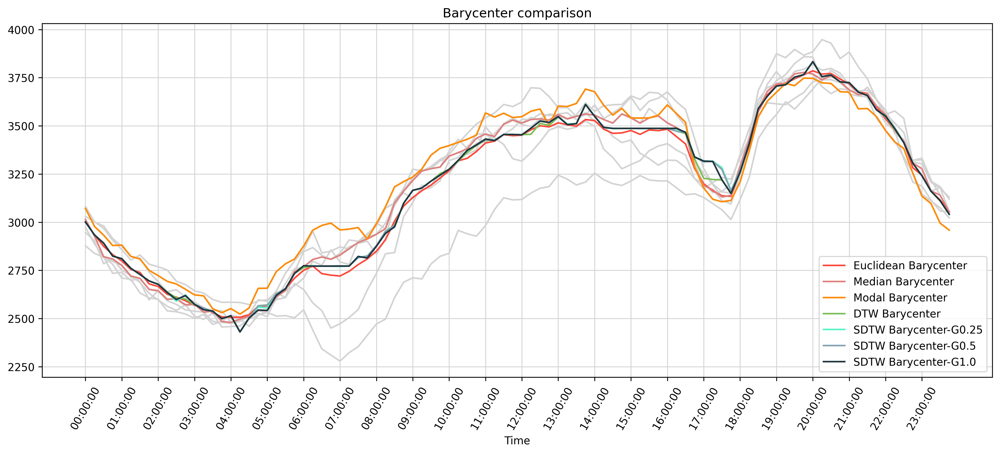

In [17]:
plot_highlighted_barycenters(jan_wk1_P_bcts_df,'Barycenter comparison')

In [63]:
jan_P_df = pd.read_csv('../data/subsequences/jan_daily_P.csv')
jan_barycenters_df = get_barycenters_from_df(jan_P_df)

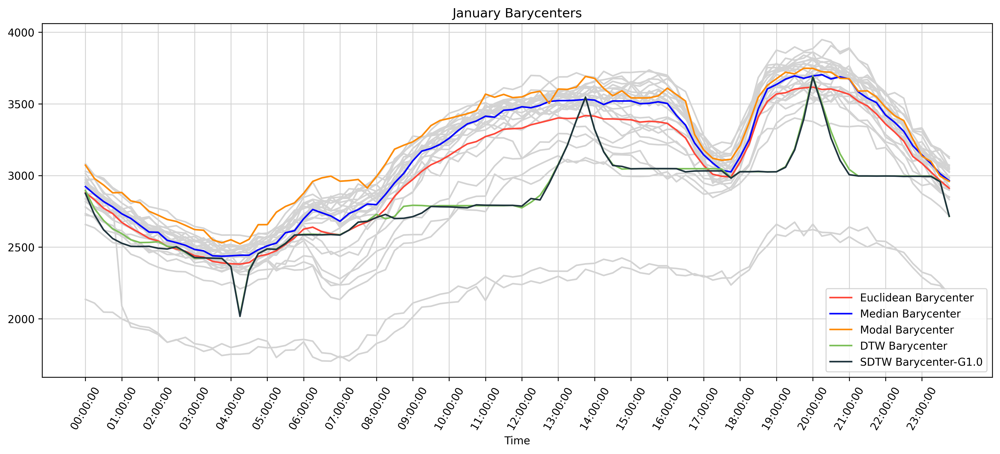

In [70]:
plot_highlighted_barycenters(jan_barycenters_df,title="January Barycenters")

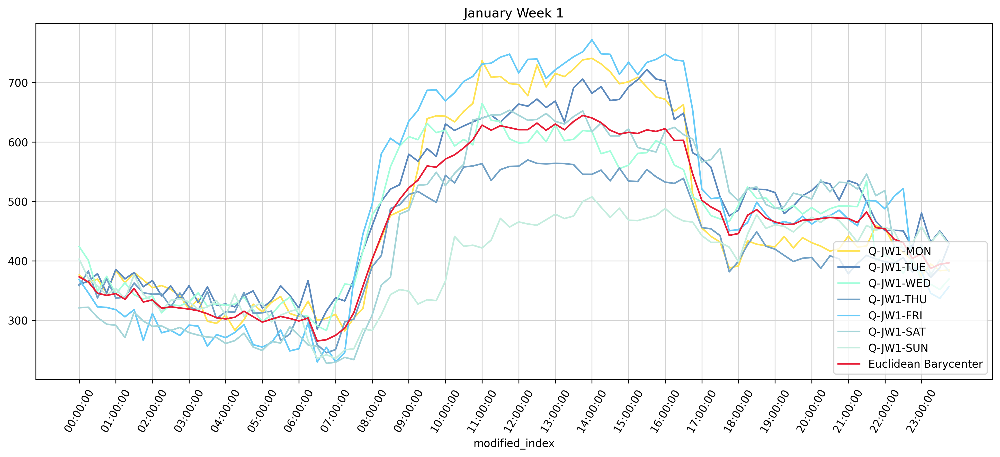

In [18]:
jan_wk1_Q_df = pd.read_csv('../data/subsequences/jan_wk1_Q.csv')
jan_wk1_Q_eba_df = get_eba_from_df(jan_wk1_Q_df)
plot_highlighted_eba(eba_df=jan_wk1_Q_eba_df,title="January Week 1")

In [57]:
jan_df = pd.read_csv('../data/subsequences/jan_daily_P.csv')
jan_bcts_df = get_barycenters_from_df(jan_df)
jan_bcts_df

KeyError: "['Unnamed: 0'] not in index"

# Fitting Barycenters on Power Data (NEEDS UPDATING)

## Real Power

In [55]:
jan_mondays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_mondays_P.csv"))
jan_tuesdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_tuesdays_P.csv"))
jan_wednesdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_wednesdays_P.csv"))
jan_thursdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_thursdays_P.csv"))
jan_fridays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_fridays_P.csv"))
jan_saturdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_saturdays_P.csv"))
jan_sundays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_sundays_P.csv"))


#averaging February weekdays
feb_mondays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_mondays_P.csv"))
feb_tuesdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_tuesdays_P.csv"))
feb_wednesdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_wednesdays_P.csv"))
feb_thursdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_thursdays_P.csv"))
feb_fridays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_fridays_P.csv"))
feb_saturdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_saturdays_P.csv"))
feb_sundays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/feb_sundays_P.csv"))


#averaging all weekdays in January and february
jan_and_feb_mondays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_mondays_P.csv"))
jan_and_feb_tuesdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_tuesdays_P.csv"))
jan_and_feb_wednesdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_wednesdays_P.csv"))
jan_and_feb_thursdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_thursdays_P.csv"))
jan_and_feb_fridays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_fridays_P.csv"))
jan_and_feb_saturdays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_saturdays_P.csv"))
jan_and_feb_sundays_P_ebas = get_barycenters_from_df(pd.read_csv("../data/subsequences/jan_and_feb_sundays_P.csv"))

#averaging weeks 1-4 in January
jan_wk1_P = pd.read_csv('../data/subsequences/jan_wk1_P.csv')
jan_wk2_P = pd.read_csv('../data/subsequences/jan_wk2_P.csv')
jan_wk3_P = pd.read_csv('../data/subsequences/jan_wk3_P.csv')
jan_wk4_P = pd.read_csv('../data/subsequences/jan_wk4_P.csv')

jan_wk1_P_ebas = get_barycenters_from_df(jan_wk1_P)
jan_wk2_P_ebas = get_barycenters_from_df(jan_wk2_P)
jan_wk3_P_ebas = get_barycenters_from_df(jan_wk3_P)
jan_wk4_P_ebas = get_barycenters_from_df(jan_wk4_P)

#averagnig weeks 1-3 in February
feb_wk1_P = pd.read_csv('../data/subsequences/feb_wk1_P.csv')
feb_wk2_P = pd.read_csv('../data/subsequences/feb_wk2_P.csv')
feb_wk3_P = pd.read_csv('../data/subsequences/feb_wk3_P.csv')

feb_wk1_P_ebas = get_barycenters_from_df(feb_wk1_P)
feb_wk2_P_ebas = get_barycenters_from_df(feb_wk2_P)
feb_wk3_P_ebas = get_barycenters_from_df(feb_wk3_P)

#averaging the month of January
jan_P_df = jan_wk1_P.join(jan_wk2_P).join(jan_wk3_P).join(jan_wk4_P)
jan_P_eba = get_barycenters_from_df(jan_P_df)

#averagnig the month of February
feb_P_df = feb_wk1_P.join(feb_wk2_P).join(feb_wk3_P)
feb_P_eba = get_barycenters_from_df(feb_P_df)


#averagnig january and february
jan_and_feb_P = jan_P_df.join(feb_P_df)
jan_and_feb_P_ebas = get_barycenters_from_df(jan_and_feb_P)

KeyError: "['Unnamed: 0'] not in index"

## Reactive Data

In [4]:
jan_mondays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_mondays_Q.csv"))
jan_tuesdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_tuesdays_Q.csv"))
jan_wednesdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_wednesdays_Q.csv"))
jan_thursdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_thursdays_Q.csv"))
jan_fridays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_fridays_Q.csv"))
jan_saturdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_saturdays_Q.csv"))
jan_sundays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_sundays_Q.csv"))


#averaging February weekdays
feb_mondays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_mondays_Q.csv"))
feb_tuesdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_tuesdays_Q.csv"))
feb_wednesdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_wednesdays_Q.csv"))
feb_thursdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_thursdays_Q.csv"))
feb_fridays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_fridays_Q.csv"))
feb_saturdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_saturdays_Q.csv"))
feb_sundays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/feb_sundays_Q.csv"))


#averaging all weekdays in January and february
jan_and_feb_mondays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_mondays_Q.csv"))
jan_and_feb_tuesdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_tuesdays_Q.csv"))
jan_and_feb_wednesdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_wednesdays_Q.csv"))
jan_and_feb_thursdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_thursdays_Q.csv"))
jan_and_feb_fridays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_fridays_Q.csv"))
jan_and_feb_saturdays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_saturdays_Q.csv"))
jan_and_feb_sundays_Q_ebas = get_eba_from_df(pd.read_csv("../data/subsequences/jan_and_feb_sundays_Q.csv"))

#averaging weeks 1-4 in January
jan_wk1_Q = pd.read_csv('../data/subsequences/jan_wk1_Q.csv')
jan_wk2_Q = pd.read_csv('../data/subsequences/jan_wk2_Q.csv')
jan_wk3_Q = pd.read_csv('../data/subsequences/jan_wk3_Q.csv')
jan_wk4_Q = pd.read_csv('../data/subsequences/jan_wk4_Q.csv')

jan_wk1_Q_ebas = get_eba_from_df(jan_wk1_Q)
jan_wk2_Q_ebas = get_eba_from_df(jan_wk2_Q)
jan_wk3_Q_ebas = get_eba_from_df(jan_wk3_Q)
jan_wk4_Q_ebas = get_eba_from_df(jan_wk4_Q)

#averagnig weeks 1-3 in February
feb_wk1_Q = pd.read_csv('../data/subsequences/feb_wk1_Q.csv')
feb_wk2_Q = pd.read_csv('../data/subsequences/feb_wk2_Q.csv')
feb_wk3_Q = pd.read_csv('../data/subsequences/feb_wk3_Q.csv')

feb_wk1_Q_ebas = get_eba_from_df(feb_wk1_Q)
feb_wk2_Q_ebas = get_eba_from_df(feb_wk2_Q)
feb_wk3_Q_ebas = get_eba_from_df(feb_wk3_Q)

#averaging the month of January
jan_Q_df = jan_wk1_Q.join(jan_wk2_Q).join(jan_wk3_Q).join(jan_wk4_Q)
jan_Q_eba = get_eba_from_df(jan_Q_df)

#averagnig the month of February
feb_Q_df = feb_wk1_Q.join(feb_wk2_Q).join(feb_wk3_Q)
feb_Q_eba = get_eba_from_df(feb_Q_df)


#averagnig january and february
jan_and_feb_Q = jan_Q_df.join(feb_Q_df)
jan_and_feb_Q_ebas = get_eba_from_df(jan_and_feb_Q)

## Saving fits

In [5]:
import os
import pandas as pd

directory = "../data/clustering/euclidean_barycenter_averages"

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)

# Get all variable names in the current environment
variables = [var for var in dir() if (var.endswith("_eba") or var.endswith("_ebas")) and isinstance(eval(var), pd.DataFrame)]

# Save each dataframe in the directory
for var in variables:
    filename = os.path.join(directory, var + ".csv")
    eval(var).to_csv(filename, index=True)




# Fitting all barycenters to subsequences of interest for report iteration on 09.06.2023

## January and February

In [163]:
jan_and_feb_P = pd.read_csv('../data/subsequences/jan_and_feb_daily_P.csv')
jan_and_feb_Q = pd.read_csv('../data/subsequences/jan_and_feb_daily_Q.csv')

In [31]:
jan_and_feb_P

,Unnamed: 0,P-JW1-MON,P-JW1-TUE,P-JW1-WED,P-JW1-THU,P-JW1-FRI,P-JW1-SAT,P-JW1-SUN,P-JW2-MON,P-JW2-TUE,...,P-FW2-FRI,P-FW2-SAT,P-FW2-SUN,P-FW3-MON,P-FW3-TUE,P-FW3-WED,P-FW3-THU,P-FW3-FRI,P-FW3-SAT,P-FW3-SUN
0,00:00:00,3071.832,2877.704,3014.638,2947.298,2973.446,3029.978,3082.161,2951.033,2840.510,...,3000.651,2964.460,2938.459,3029.604,2986.669,3109.663,3066.046,3001.912,3083.896,2999.082
1,00:15:00,2978.160,2837.915,2927.678,2902.763,2887.630,3002.107,3002.023,2902.292,2765.533,...,2964.410,2905.879,2900.575,2932.351,2948.981,3051.881,3013.143,2927.982,3008.712,2942.221
2,00:30:00,2933.031,2818.541,2821.222,2784.637,2817.670,2967.794,2980.230,2857.068,2684.652,...,2920.852,2898.427,2838.816,2875.747,2871.312,3007.032,2952.263,2889.920,2962.283,2950.568
3,00:45:00,2878.928,2734.480,2781.378,2808.900,2796.380,2906.573,2915.397,2797.825,2629.461,...,2846.574,2857.335,2793.413,2813.213,2836.349,2948.983,2865.556,2780.830,2900.605,2899.392
4,01:00:00,2881.163,2739.832,2710.183,2751.774,2775.842,2857.319,2874.862,2741.989,2614.501,...,2785.212,2789.281,2746.059,2808.662,2733.304,2929.066,2835.484,2720.138,2835.871,2859.473
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,22:45:00,3253.669,3306.997,3256.090,3207.752,3312.257,3321.875,3320.155,3212.808,2944.720,...,3217.709,3166.037,3264.568,3352.266,3392.858,3338.875,3341.666,3360.807,3215.341,3321.433
92,23:00:00,3135.095,3277.547,3145.562,3187.365,3303.048,3323.098,3331.967,3119.631,2873.001,...,3185.425,3175.201,3205.737,3272.706,3342.969,3305.466,3297.370,3319.963,3200.933,3249.987
93,23:15:00,3096.660,3162.338,3109.879,3114.297,3206.821,3212.273,3219.921,3015.111,2834.910,...,3078.406,3077.418,3180.053,3200.370,3273.340,3232.459,3195.656,3231.179,3129.438,3128.297
94,23:30:00,2994.902,3179.127,3074.823,3057.681,3176.438,3183.976,3140.238,2927.845,2783.953,...,3087.139,3071.763,3109.902,3121.777,3215.391,3141.958,3178.115,3143.640,3056.479,3044.417


In [164]:
#fitting to two months of data

# REAL POWER for both Jan and Feb

plt.rcdefaults()
df = get_barycenters_from_df(jan_and_feb_P)
cols = df.columns.to_list()

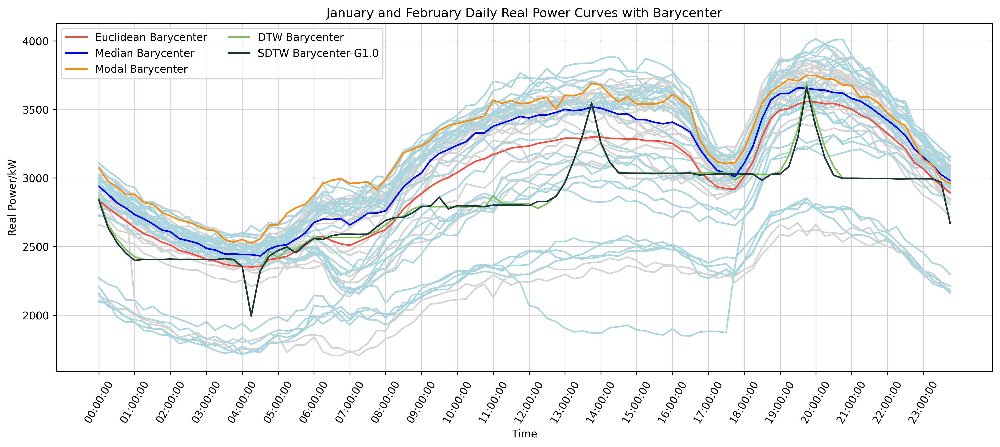

In [165]:
bcts_cols = [element for element in cols if 'Barycenter' in element]
base_cols = [element for element in cols if 'Barycenter' not in element]
jan_cols = [element for element in base_cols if 'J' in element]
feb_cols = [element for element in base_cols if 'F' in element]
plt.rcParams["figure.dpi"] = 300

# Set the color of the lines to light grey
base_color = 'lightgrey'
diverging_colors = ['#fe483a','#0000FF','#fe8c08','#7cbf58','#20353e' ,'#FF00FF','#5af3c5']


# jan_color = '#C8D5B9'
jan_color = base_color

feb_color = '#a9d5de'

# Plot the raw daily load profiles
for idx,col in enumerate(jan_cols):
    df[col].plot(color=jan_color,label='_'+col)

# Plot the raw daily load profiles
for idx,col in enumerate(feb_cols):
    df[col].plot(color=feb_color,label='_'+col)

#plot the barycenter fits
last_col = 0
for idx,col in enumerate(bcts_cols):
    if idx == len(bcts_cols)-1:
        last_col = col
    else:
        df[col].plot(color=diverging_colors[idx],label=col)

ax = df[last_col].plot(color=diverging_colors[idx],label=last_col,xticks=range(0, len(df), 4), figsize=(16, 6),rot=60) #remove x-ticks param for easier generalization
ax.grid(which='major',color='lightgrey')
plt.legend(loc='upper left',ncols=2)

# Set the title of the plot
plt.title('January and February Daily Real Power Curves with Barycenter')
plt.xlabel('Time')
plt.ylabel('Real Power/kW')
# Show the plot
plt.show()

In [166]:
#fitting to two months of data

# REACTIVE POWER for both Jan and Feb
plt.rcdefaults()
df = get_barycenters_from_df(jan_and_feb_Q)
cols = df.columns.to_list()


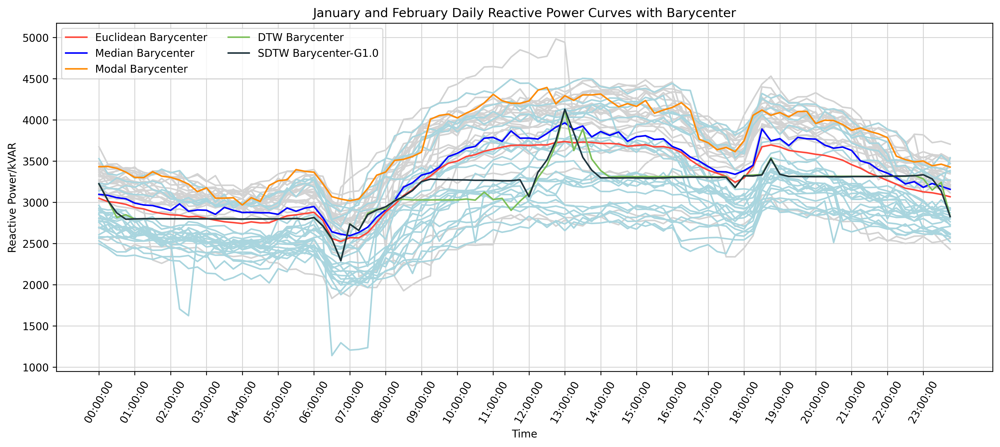

In [167]:
bcts_cols = [element for element in cols if 'Barycenter' in element]
base_cols = [element for element in cols if 'Barycenter' not in element]
jan_cols = [element for element in base_cols if 'J' in element]
feb_cols = [element for element in base_cols if 'F' in element]
plt.rcParams["figure.dpi"] = 300

# Set the color of the lines to light grey
base_color = 'lightgrey'
diverging_colors = ['#fe483a','#0000FF','#fe8c08','#7cbf58','#20353e' ,'#FF00FF','#5af3c5']


# jan_color = '#C8D5B9'
jan_color = base_color
feb_color = '#a9d5de'

# Plot the raw daily load profiles
for idx,col in enumerate(jan_cols):
    df[col].plot(color=jan_color,label='_'+col)

# Plot the raw daily load profiles
for idx,col in enumerate(feb_cols):
    df[col].plot(color=feb_color,label='_'+col)

#plot the barycenter fits
last_col = 0
for idx,col in enumerate(bcts_cols):
    if idx == len(bcts_cols)-1:
        last_col = col
    else:
        df[col].plot(color=diverging_colors[idx],label=col)

ax = df[last_col].plot(color=diverging_colors[idx],label=last_col,xticks=range(0, len(df), 4), figsize=(16, 6),rot=60) #remove x-ticks param for easier generalization
ax.grid(which='major',color='lightgrey')
plt.legend(loc='upper left',ncols=2)

# Set the title of the plot
plt.title('January and February Daily Reactive Power Curves with Barycenter')
plt.xlabel('Time')
plt.ylabel('Reactive Power/kVAR')
# Show the plot
plt.show()

## Weekdays

In [88]:
jan_and_feb_mondays_P = pd.read_csv('../data/subsequences/jan_and_feb_mondays_P.csv')
jan_and_feb_tuesdays_P = pd.read_csv('../data/subsequences/jan_and_feb_tuesdays_P.csv')
jan_and_feb_wednesdays_P = pd.read_csv('../data/subsequences/jan_and_feb_wednesdays_P.csv')
jan_and_feb_thursdays_P = pd.read_csv('../data/subsequences/jan_and_feb_thursdays_P.csv')
jan_and_feb_fridays_P = pd.read_csv('../data/subsequences/jan_and_feb_fridays_P.csv')
jan_and_feb_sundays_P = pd.read_csv('../data/subsequences/jan_and_feb_sundays_P.csv')
jan_and_feb_saturdays_P = pd.read_csv('../data/subsequences/jan_and_feb_saturdays_P.csv')

jan_and_feb_mondays_P_bcts = get_barycenters_from_df(jan_and_feb_mondays_P)
jan_and_feb_tuesdays_P_bcts = get_barycenters_from_df(jan_and_feb_tuesdays_P)
jan_and_feb_wednesdays_P_bcts = get_barycenters_from_df(jan_and_feb_wednesdays_P)
jan_and_feb_thursdays_P_bcts = get_barycenters_from_df(jan_and_feb_thursdays_P)
jan_and_feb_fridays_P_bcts = get_barycenters_from_df(jan_and_feb_fridays_P)
jan_and_feb_saturdays_P_bcts = get_barycenters_from_df(jan_and_feb_saturdays_P)
jan_and_feb_sundays_P_bcts = get_barycenters_from_df(jan_and_feb_sundays_P)

/home/shankar/miniconda3/envs/gpu_acc/lib/python3.10/site-packages/tslearn/barycenters/softdtw.py:103: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X_ = numpy.array([to_time_series(d, remove_nans=True) for d in X_])


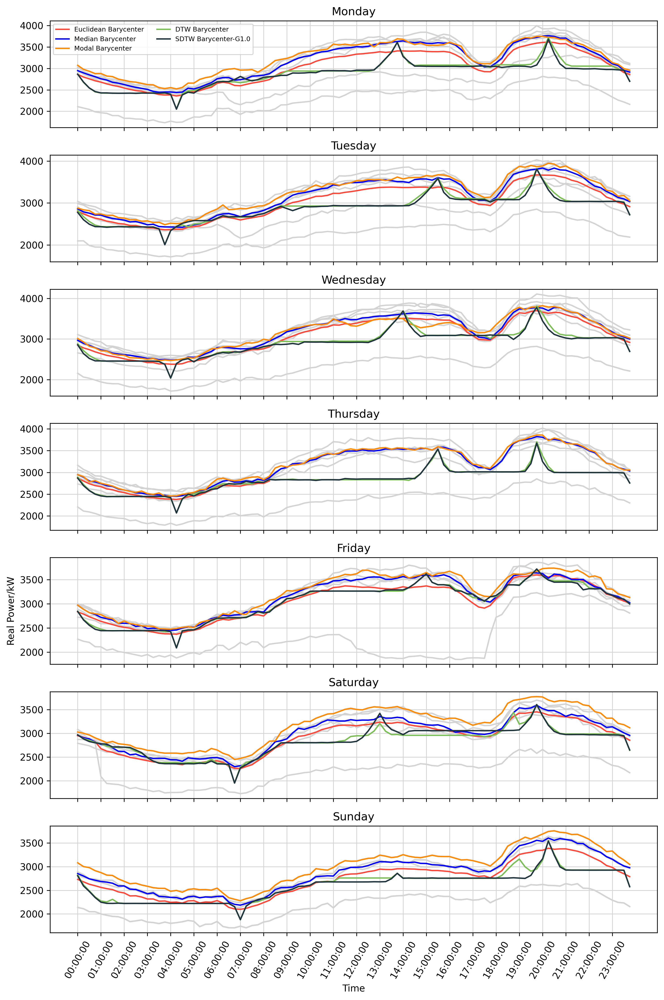

In [162]:
dataframes = [jan_and_feb_mondays_P_bcts, jan_and_feb_tuesdays_P_bcts, jan_and_feb_wednesdays_P_bcts, 
              jan_and_feb_thursdays_P_bcts, jan_and_feb_fridays_P_bcts, jan_and_feb_saturdays_P_bcts, 
              jan_and_feb_sundays_P_bcts]
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

fig, axs = plt.subplots(len(dataframes), 1, sharex=True, figsize=(10, 15))
time_index = dataframes[0].index

diverging_colors = ['#fe483a','#0000FF','#fe8c08','#7cbf58','#20353e' ,'#FF00FF','#5af3c5']

for df_idx,df in enumerate(dataframes):
    cols = df.columns.to_list()
    bcts_cols = [element for element in cols if 'Barycenter' in element]
    base_cols = [element for element in cols if 'Barycenter' not in element]
    axs[df_idx].plot(time_index,df[base_cols],color='lightgrey')
    axs[df_idx].set_title(days_of_week[df_idx])
    for idx,val in enumerate(bcts_cols):
        axs[df_idx].plot(time_index,df[val],color=diverging_colors[idx],label=val)

    axs[df_idx].set_xticks(range(0, len(df), 4), figsize=(16, 6))
    axs[df_idx].grid(which='major',color='lightgrey')
    
axs[0].legend(loc='upper left',ncols=2,fontsize='7')
axs[4].set_ylabel('Real Power/kW')
plt.rcParams["figure.dpi"] = 300
plt.tick_params(axis='x', labelrotation=60)
plt.xlabel('Time')
plt.tight_layout()
plt.show()

In [151]:
jan_and_feb_mondays_Q = pd.read_csv('../data/subsequences/jan_and_feb_mondays_Q.csv')
jan_and_feb_tuesdays_Q = pd.read_csv('../data/subsequences/jan_and_feb_tuesdays_Q.csv')
jan_and_feb_wednesdays_Q = pd.read_csv('../data/subsequences/jan_and_feb_wednesdays_Q.csv')
jan_and_feb_thursdays_Q = pd.read_csv('../data/subsequences/jan_and_feb_thursdays_Q.csv')
jan_and_feb_fridays_Q = pd.read_csv('../data/subsequences/jan_and_feb_fridays_Q.csv')
jan_and_feb_sundays_Q = pd.read_csv('../data/subsequences/jan_and_feb_sundays_Q.csv')
jan_and_feb_saturdays_Q = pd.read_csv('../data/subsequences/jan_and_feb_saturdays_Q.csv')

jan_and_feb_mondays_Q_bcts = get_barycenters_from_df(jan_and_feb_mondays_Q)
jan_and_feb_tuesdays_Q_bcts = get_barycenters_from_df(jan_and_feb_tuesdays_Q)
jan_and_feb_wednesdays_Q_bcts = get_barycenters_from_df(jan_and_feb_wednesdays_Q)
jan_and_feb_thursdays_Q_bcts = get_barycenters_from_df(jan_and_feb_thursdays_Q)
jan_and_feb_fridays_Q_bcts = get_barycenters_from_df(jan_and_feb_fridays_Q)
jan_and_feb_saturdays_Q_bcts = get_barycenters_from_df(jan_and_feb_saturdays_Q)
jan_and_feb_sundays_Q_bcts = get_barycenters_from_df(jan_and_feb_sundays_Q)

/home/shankar/miniconda3/envs/gpu_acc/lib/python3.10/site-packages/tslearn/barycenters/softdtw.py:103: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X_ = numpy.array([to_time_series(d, remove_nans=True) for d in X_])


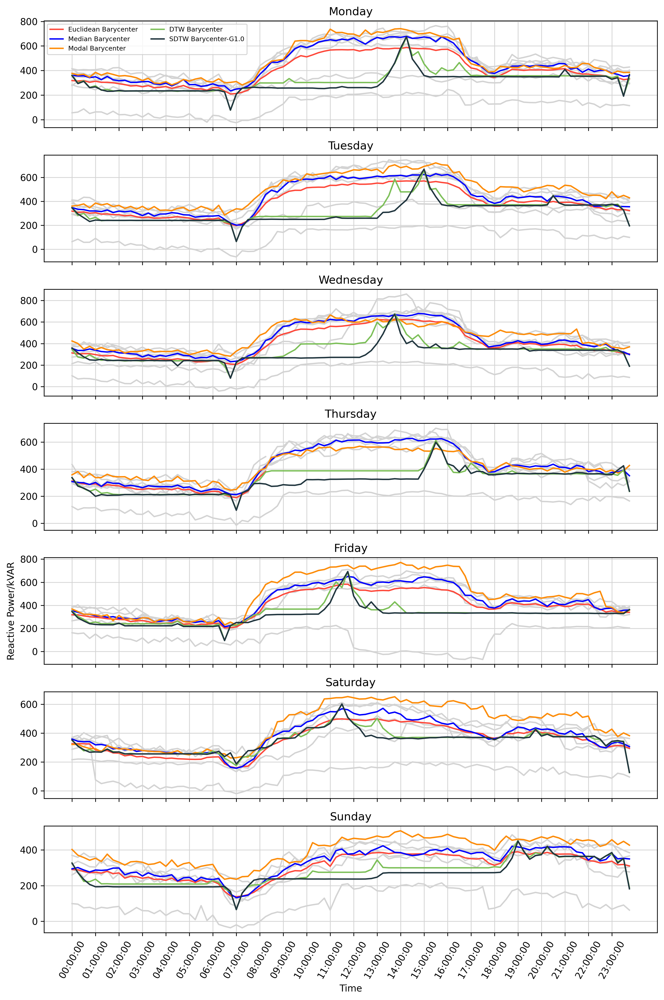

In [160]:
dataframes = [jan_and_feb_mondays_Q_bcts, jan_and_feb_tuesdays_Q_bcts, jan_and_feb_wednesdays_Q_bcts, 
              jan_and_feb_thursdays_Q_bcts, jan_and_feb_fridays_Q_bcts, jan_and_feb_saturdays_Q_bcts, 
              jan_and_feb_sundays_Q_bcts]
days_of_week = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

fig, axs = plt.subplots(len(dataframes), 1, sharex=True, figsize=(10, 15))
time_index = dataframes[0].index

diverging_colors = ['#fe483a','#0000FF','#fe8c08','#7cbf58','#20353e' ,'#FF00FF','#5af3c5']

for df_idx,df in enumerate(dataframes):
    cols = df.columns.to_list()
    bcts_cols = [element for element in cols if 'Barycenter' in element]
    base_cols = [element for element in cols if 'Barycenter' not in element]
    axs[df_idx].plot(time_index,df[base_cols],color='lightgrey')
    axs[df_idx].set_title(days_of_week[df_idx])
    for idx,val in enumerate(bcts_cols):
        axs[df_idx].plot(time_index,df[val],color=diverging_colors[idx],label=val)

    axs[df_idx].set_xticks(range(0, len(df), 4), figsize=(16, 6))
    axs[df_idx].grid(which='major',color='lightgrey')
    
axs[0].legend(loc='upper left',ncols=2,fontsize='7')
axs[4].set_ylabel('Reactive Power/kVAR')
plt.rcParams["figure.dpi"] = 300
plt.tick_params(axis='x', labelrotation=60)
plt.xlabel('Time')
plt.tight_layout()
plt.show()

In [133]:
base_cols

['P-JW1-MON',
 'P-JW2-MON',
 'P-JW3-MON',
 'P-JW4-MON',
 'P-FW1-MON',
 'P-FW2-MON',
 'P-FW3-MON',
 'P-FW4-MON']

In [132]:
dataframes[1][:]

,P-JW1-TUE,P-JW2-TUE,P-JW3-TUE,P-JW4-TUE,P-FW1-TUE,P-FW2-TUE,P-FW3-TUE,P-FW4-TUE,Euclidean Barycenter,Median Barycenter,Modal Barycenter,DTW Barycenter,SDTW Barycenter-G1.0
modified_index,,,,,,,,,,,,,
00:00:00,2877.704,2840.510,2780.089,2834.559,2094.827,2911.338,2986.669,3040.168,2795.733000,2859.1070,2877.704,2819.909563,2775.737110
00:15:00,2837.915,2765.533,2731.487,2783.538,2096.814,2792.807,2948.981,2973.771,2741.355750,2788.1725,2837.915,2671.654803,2600.657371
00:30:00,2818.541,2684.652,2680.746,2758.673,1985.747,2754.974,2871.312,2937.610,2686.531875,2756.8235,2818.541,2558.504034,2493.418252
00:45:00,2734.480,2629.461,2625.071,2694.599,1948.770,2737.214,2836.349,2910.064,2639.501000,2714.5395,2734.480,2472.837446,2435.793697
01:00:00,2739.832,2614.501,2572.112,2731.657,1947.957,2692.779,2733.304,2847.615,2609.969625,2712.2180,2739.832,2436.289125,2433.232381
...,...,...,...,...,...,...,...,...,...,...,...,...,...
22:45:00,3306.997,2944.720,3220.551,3285.284,2348.684,3268.060,3392.858,3366.623,3141.722125,3276.6720,3306.997,3039.580000,3037.126503
23:00:00,3277.547,2873.001,3234.783,3187.039,2311.291,3184.786,3342.969,3329.773,3092.648625,3210.9110,3277.547,3039.580000,3037.507726
23:15:00,3162.338,2834.910,3139.241,3123.739,2229.916,3105.421,3273.340,3246.727,3014.454000,3131.4900,3162.338,3039.580000,3038.815598


## Visualizing Real and Reactive Power Behaviour in January

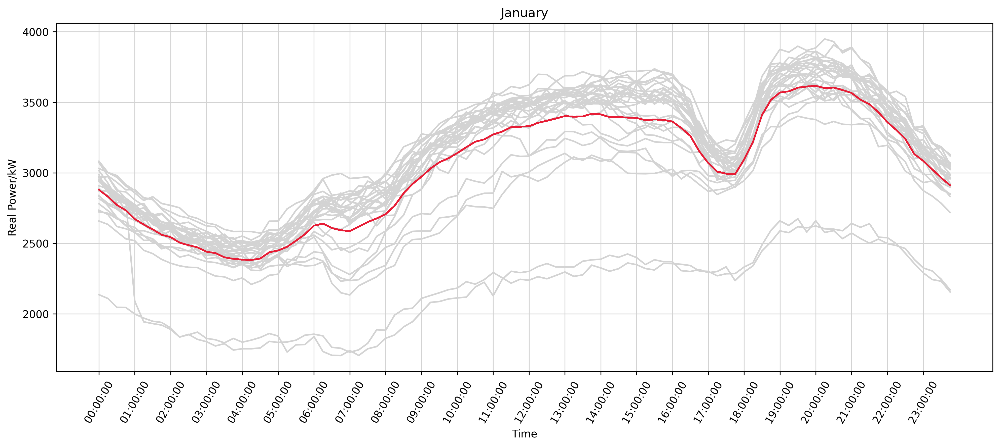

In [89]:
plot_highlighted_power_eba(jan_P_eba,title="January",subseq_type="all_days_in_month")

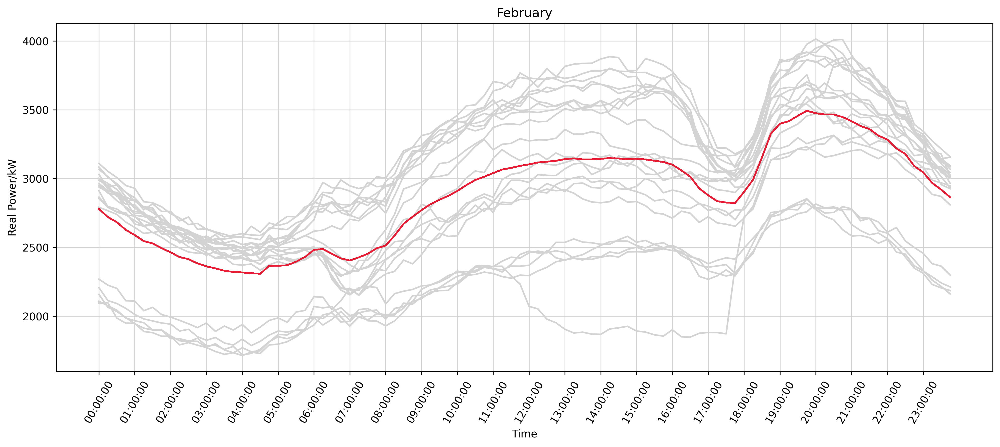

In [90]:
plot_highlighted_power_eba(feb_P_eba,title="February",subseq_type="all_days_in_month")

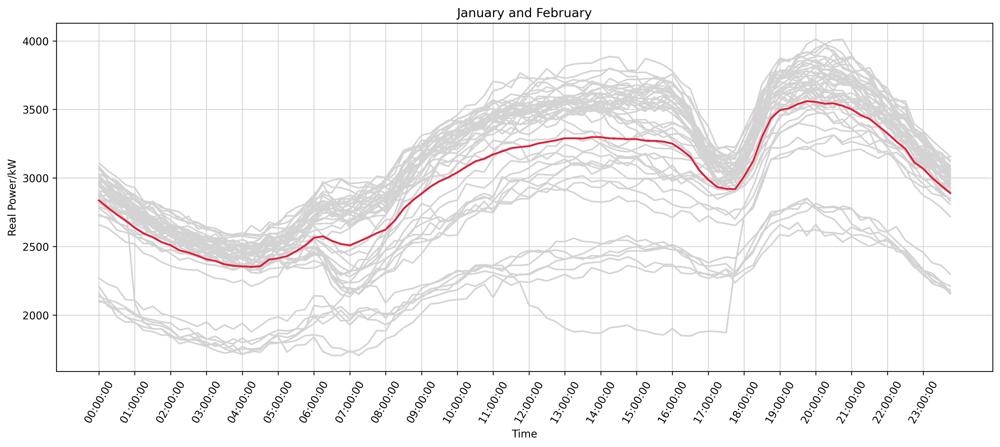

In [13]:
plot_highlighted_power_eba(jan_and_feb_P_ebas,title="January and February",subseq_type="all_days_in_month",p_axis=True)

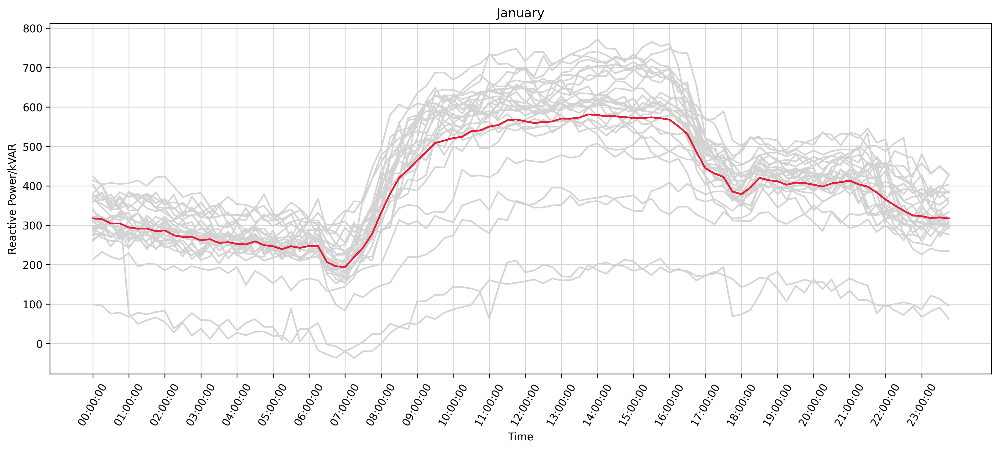

In [91]:
plot_highlighted_power_eba(jan_Q_eba,title="January",subseq_type="all_days_in_month",q_axis=True,p_axis=False)

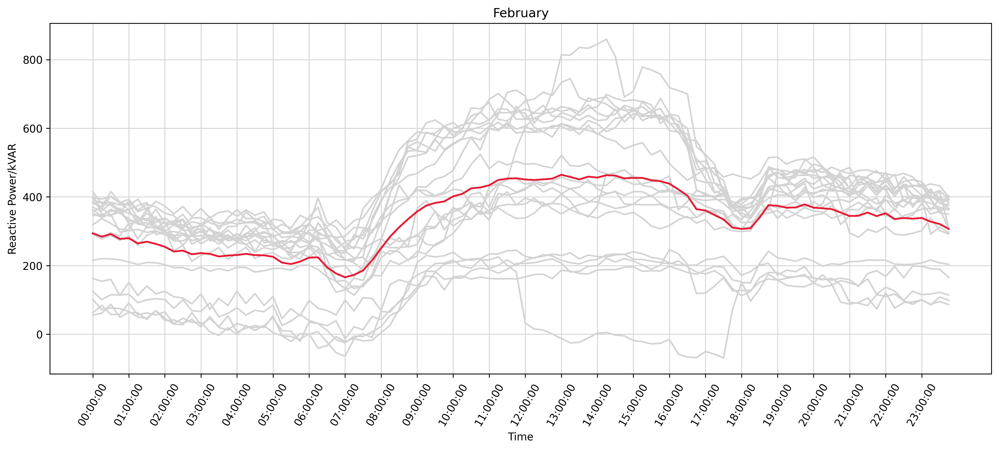

In [93]:
plot_highlighted_power_eba(feb_Q_eba,title="February",subseq_type="all_days_in_month",q_axis=True,p_axis=False)

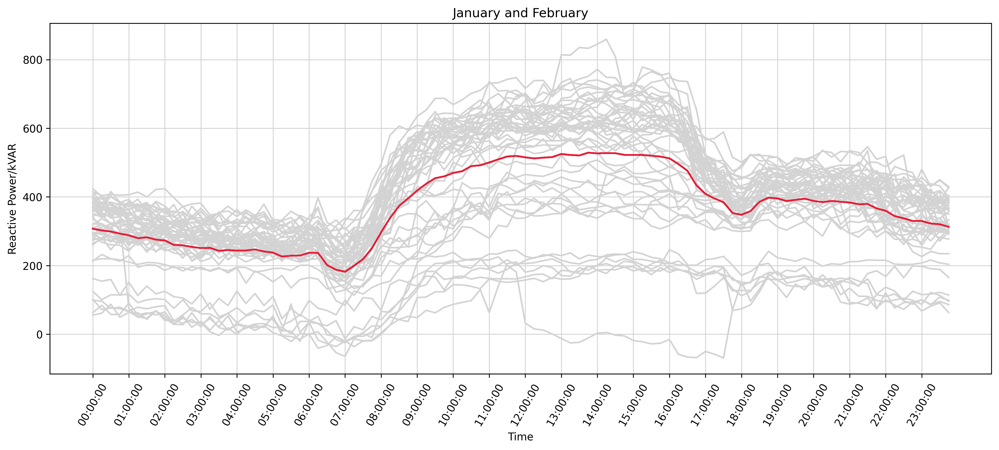

In [11]:
plot_highlighted_power_eba(jan_and_feb_Q_ebas,title="January and February",subseq_type="all_days_in_month",q_axis=True,p_axis=False)